### Modules and parameters

In [1]:
include("../src/SpiDy.jl");
using .SpiDy

using LinearAlgebra
using DifferentialEquations
using FFTW
using Random
using Distributions
using Statistics
using Interpolations
using DSP
using Plots
using StatsBase
using NPZ
using Cubature

### Parameters

In [2]:
Δt = 0.15
N = 100_000
Random.seed!(123) # the exclamation mark here is warning us that we are changing a global property, in this case the random seed

J = LorentzianSD(1., 7., 5.)
println(J.α)
println(J.ω0)
println(J.Γ)

1.0
7.0
5.0


### Classical noise

In [3]:
noise = ClassicalNoise(0.001);
fpsd = psd(J, noise);
fspectrum = spectrum(noise);

#### Stochastic field

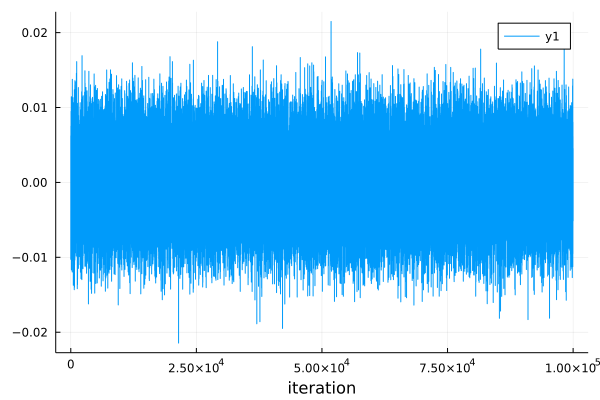

In [4]:
plot(bfield(N, Δt, J, noise; interpolation=false), xlabel="iteration")

#### Spectrum, imag(kernel) and psd

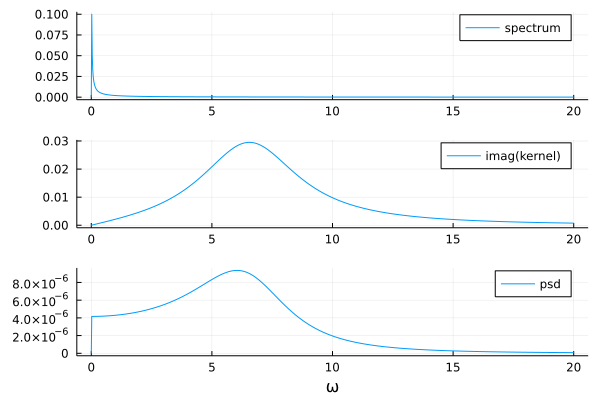

In [5]:
freqrange = LinRange(0, 20, 1000)
atest = spectrum(noise).(freqrange)
btest = imag.(kernel(J).(freqrange))
p1 = plot(freqrange, atest, label="spectrum");
p2 = plot(freqrange, btest, label="imag(kernel)");
p3 = plot(freqrange, atest.*btest, label="psd", xlabel = "ω")
plot(p1, p2, p3, layout=(3, 1))

#### Compare periodogram of the stochastic field with psd

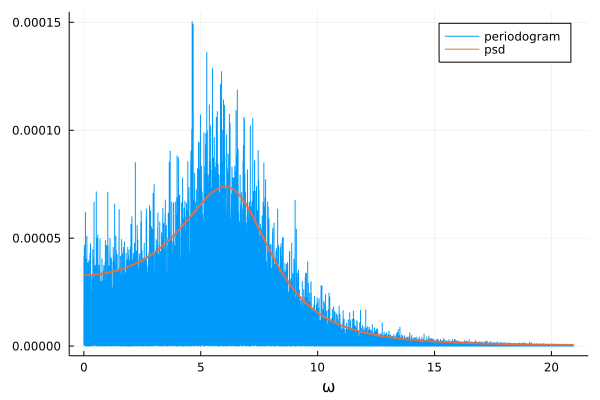

In [6]:
angfreq = 2π*rfftfreq(N, 1/Δt);
b = bfield(N, Δt, J, noise; interpolation=false)
psdperiodogram = periodogram(b, nfft=N, fs=1/Δt)
psdint = hquadrature(fpsd, angfreq[1], angfreq[end])[1]

plot(2π*freq(psdperiodogram), power(psdperiodogram), xlabel = "ω", label="periodogram")
plot!(angfreq, fpsd.(angfreq)/psdint*var(b)*25, lw=2, label="psd")

# The computed periodogram is normalized so that the area under the periodogram is
# equal to the uncentered variance (or average power) of the original signal

### Quantum noise

In [7]:
noise = QuantumNoise(0.01);
fpsd = psd(J, noise);
fspectrum = spectrum(noise);

#### Stochastic field

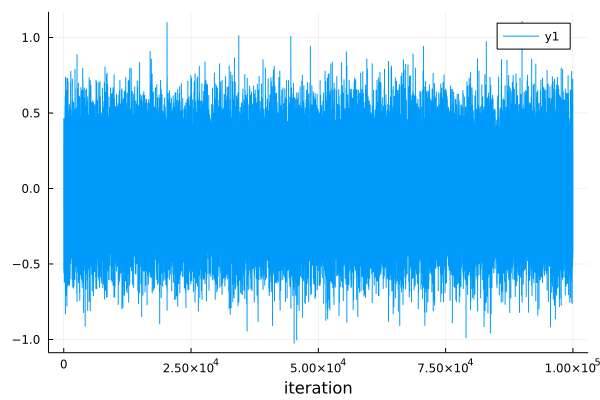

In [8]:
plot(bfield(N, Δt, J, noise; interpolation=false), xlabel="iteration")

#### Spectrum, imag(kernel) and psd

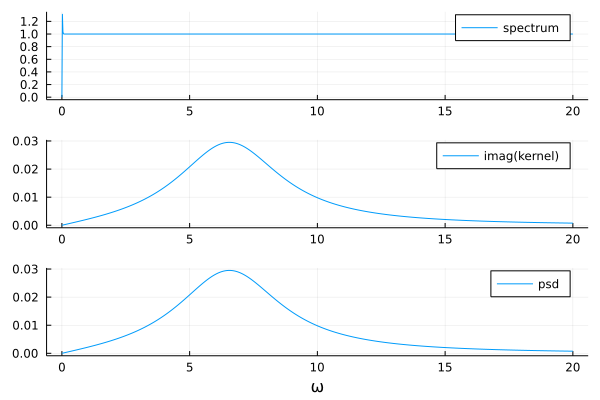

In [9]:
freqrange = LinRange(0, 20, 1000)
atest = spectrum(noise).(freqrange)
btest = imag.(kernel(J).(freqrange))
p1 = plot(freqrange, atest, label="spectrum");
p2 = plot(freqrange, btest, label="imag(kernel)");
p3 = plot(freqrange, atest.*btest, label="psd", xlabel = "ω")
plot(p1, p2, p3, layout=(3, 1))

#### Compare periodogram of the stochastic field with psd

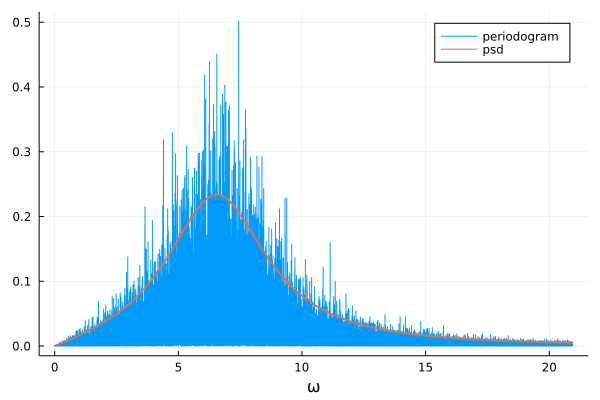

In [10]:
angfreq = 2π*rfftfreq(N, 1/Δt);
b = bfield(N, Δt, J, noise; interpolation=false)
psdperiodogram = periodogram(b, nfft=N, fs=1/Δt)
psdint = hquadrature(fpsd, angfreq[1], angfreq[end])[1]

plot(2π*freq(psdperiodogram), power(psdperiodogram), xlabel = "ω", label="periodogram")
plot!(angfreq, fpsd.(angfreq)/psdint*var(b)*25, lw=2, label="psd")

# The computed periodogram is normalized so that the area under the periodogram is
# equal to the uncentered variance (or average power) of the original signal

### Coupling tensor

In [11]:
matrixaniso = AnisoCoupling([-sin(π/4) 0. 0.
                        0. 0. 0.
                        cos(π/4) 0. 0.]);
matrixaniso.C

3×3 Matrix{Float64}:
 -0.707107  0.0  0.0
  0.0       0.0  0.0
  0.707107  0.0  0.0

In [12]:
matrixiso = IsoCoupling(2.);
matrixiso.C

2.0

### Dynamics

In [20]:
tspan = (0., N*Δt)
saveat = ((N*4÷5):1:N)*Δt
s0 = normalize(rand(3))
noise = QuantumNoise(0.01)
bfields = [bfield(N, Δt, J, noise),
           bfield(N, Δt, J, noise),
           bfield(N, Δt, J, noise)];

sol = diffeqsolver(s0, tspan, J, bfields, matrixaniso; saveat=saveat);

s = zeros(1, 3)
s[1, :] = mean(sol[2], dims=1)

1×3 Matrix{Float64}:
 0.00118135  0.000123758  -0.547394